In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Let's define some functions that will let us show images, and upload and 
#download files
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  #plt.rcParams['figure.figsize'] = [10, 5]
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()
  
  
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)
def download(path):
  from google.colab import files
  files.download(path)

In [1]:
!ls
!rm -fr darknet
!git clone https://github.com/AlexeyAB/darknet/
  
!git clone https://github.com/rafiuddinkhan/Yolo-Training-GoogleColab

sample_data
Cloning into 'darknet'...
remote: Enumerating objects: 10572, done.
remote: Total 10572 (delta 0), reused 0 (delta 0), pack-reused 10572
Receiving objects: 100% (10572/10572), 10.24 MiB | 19.83 MiB/s, done.
Resolving deltas: 100% (7140/7140), done.
Cloning into 'Yolo-Training-GoogleColab'...
remote: Enumerating objects: 349, done.
remote: Counting objects: 100% (349/349), done.
remote: Compressing objects: 100% (243/243), done.
remote: Total 349 (delta 105), reused 323 (delta 94), pack-reused 0
Receiving objects: 100% (349/349), 136.16 MiB | 46.65 MiB/s, done.
Resolving deltas: 100% (105/105), done.


In [0]:
cd darknet

In [0]:
!apt-get update
!apt-get upgrade

In [0]:
!apt-get install build-essential
!apt-get install cmake git libgtk2.0-dev pkg-config libavcodec-dev libavformat-dev libswscale-dev

In [0]:
!apt-get install libavcodec-dev libavformat-dev libswscale-d

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package libswscale-d


In [0]:
!apt-get -y install cmake
!which cmake

!cmake --version

Reading package lists... Done
Building dependency tree       
Reading state information... Done
cmake is already the newest version (3.10.2-1ubuntu2).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 4 not upgraded.
/usr/local/bin/cmake
cmake version 3.12.0

CMake suite maintained and supported by Kitware (kitware.com/cmake).


In [0]:
!apt-get install libopencv-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libopencv-dev is already the newest version (3.2.0+dfsg-4ubuntu0.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 4 not upgraded.


In [0]:
!apt-get install vim

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libgpm2 vim-common vim-runtime xxd
Suggested packages:
  gpm ctags vim-doc vim-scripts
The following NEW packages will be installed:
  libgpm2 vim vim-common vim-runtime xxd
0 upgraded, 5 newly installed, 0 to remove and 4 not upgraded.
Need to get 6,721 kB of archives.
After this operation, 32.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 xxd amd64 2:8.0.1453-1ubuntu1.1 [49.2 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 vim-common all 2:8.0.1453-1ubuntu1.1 [70.4 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/main amd64 libgpm2 amd64 1.20.7-5 [15.1 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 

In [0]:
#Now let's get some YOLOv3 weights from the official site
!ls
!wget https://pjreddie.com/media/files/yolov3.weights

3rdparty      cmake		      image_yolov2.sh	     net_cam_v3.sh
appveyor.yml  CMakeLists.txt	      image_yolov3.sh	     README.md
build	      DarknetConfig.cmake.in  include		     scripts
build.ps1     darknet.py	      json_mjpeg_streams.sh  src
build.sh      darknet_video.py	      LICENSE		     video_v2.sh
cfg	      data		      Makefile		     video_yolov3.sh
--2019-07-11 01:23:22--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  40.1MB/s    in 6.3s    

2019-07-11 01:23:29 (37.5 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [0]:
%cd ..

In [0]:
#No here we're modifying the makefile to set OPENCV and GPU to 1
!ls
!sed -i 's/OPENCV=0/OPENCV=1/g' Makefile
!sed -i 's/GPU=0/GPU=1/g' Makefile

3rdparty      CMakeLists.txt	      include		     src
appveyor.yml  DarknetConfig.cmake.in  json_mjpeg_streams.sh  video_v2.sh
build	      darknet.py	      LICENSE		     video_yolov3.sh
build.ps1     darknet_video.py	      Makefile		     yolov3.weights
build.sh      data		      net_cam_v3.sh
cfg	      image_yolov2.sh	      README.md
cmake	      image_yolov3.sh	      scripts


In [0]:
!apt install g++-5
!apt install gcc-5

!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 10
!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 20
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 10
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 20
!update-alternatives --install /usr/bin/cc cc /usr/bin/gcc 30
!update-alternatives --set cc /usr/bin/gcc
!update-alternatives --install /usr/bin/c++ c++ /usr/bin/g++ 30
!update-alternatives --set c++ /usr/bin/g++

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  cpp-5 gcc-5 gcc-5-base libasan2 libgcc-5-dev libisl15 libmpx0
  libstdc++-5-dev
Suggested packages:
  gcc-5-locales g++-5-multilib gcc-5-doc libstdc++6-5-dbg gcc-5-multilib
  libgcc1-dbg libgomp1-dbg libitm1-dbg libatomic1-dbg libasan2-dbg
  liblsan0-dbg libtsan0-dbg libubsan0-dbg libcilkrts5-dbg libmpx0-dbg
  libquadmath0-dbg libstdc++-5-doc
The following NEW packages will be installed:
  cpp-5 g++-5 gcc-5 gcc-5-base libasan2 libgcc-5-dev libisl15 libmpx0
  libstdc++-5-dev
0 upgraded, 9 newly installed, 0 to remove and 4 not upgraded.
Need to get 29.1 MB of archives.
After this operation, 100 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 gcc-5-base

In [0]:
#Now, here's a bunch of code that takes the longest to execute here but
#It's about installing CUDA and using the beautiful Tesla K80 GPU, so that
#Will worth it

!apt update -qq;
!wget https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
!dpkg -i cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
!apt-get update -qq

#Here were are installing compilers and creating some links
!apt-get install cuda -y -qq #gcc-5 g++-5 
#!ln -s /usr/bin/gcc-5 /usr/local/cuda/bin/gcc
#!ln -s /usr/bin/g++-5 /usr/local/cuda/bin/g++
!apt update
!apt upgrade
!apt install cuda-8.0 -y

4 packages can be upgraded. Run 'apt list --upgradable' to see them.
--2019-07-11 01:24:14--  https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
Resolving developer.nvidia.com (developer.nvidia.com)... 192.229.162.216
Connecting to developer.nvidia.com (developer.nvidia.com)|192.229.162.216|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://developer.download.nvidia.com/compute/cuda/8.0/secure/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64.deb?-lbsHj_EwxMwsV_qsCnaXeRx7FPZPuQMVy8HO8xZ_MyGnKO1JbO0j0NH4I3nmQJPDb5BUU1RolAia6f7Fgml5D_ask5g-PFog-t_vE-nt9nDP1TGxuprijhfTUcZmlxkhVUzH8yMOxvfez0ZqFnNQypuUf5H8UVgXKiya8NpfKcbLklPfpHxDdiC0cVVNB9Fydj4UZg799UF1WMG4dFi3H8Wmw [following]
--2019-07-11 01:24:15--  https://developer.download.nvidia.com/compute/cuda/8.0/secure/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64.deb?-lbsHj_EwxMwsV_qsCnaXeR

In [0]:
#Now let's see whether the GPU is here and CUDA was successfully installed!
import tensorflow as tf
device_name = tf.test.gpu_device_name()
print(device_name)

print("'sup!'")

!/usr/local/cuda/bin/nvcc --version

/device:GPU:0
'sup!'
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2016 NVIDIA Corporation
Built on Tue_Jan_10_13:22:03_CST_2017
Cuda compilation tools, release 8.0, V8.0.61


In [0]:
ls

cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
darknet/
sample_data/
Yolo-Training-GoogleColab/


In [0]:
%cd darknet
!make

/content/darknet
mkdir -p obj
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(mat_cv*, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:896:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^
./src/image_opencv.cpp: At global scope:
./src/image_opencv.cpp:420:14: warning: ‘float get_pixel(image, int, int, int)’ defined but not used [-Wunused-function]
 static float get_pixel(image m, int x, int y, int c)
              ^
g++ -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -Wall -Wfatal-errors -Wno-unused

In [0]:
!mkdir data_for_colab

In [0]:
!cp /content/Yolo-Training-GoogleColab/data_for_colab/yolov3-tiny-obj.cfg data_for_colab/yolov3-tiny-obj.cfg
!cp /content/Yolo-Training-GoogleColab/data_for_colab/yolov3-tiny.conv.15 data_for_colab/yolov3-tiny.conv.15

In [0]:
!ls
#Now, let's see if everything works by running it on a test image
!./darknet detect data_for_colab/yolov3-tiny-obj.cfg data_for_colab/yolov3-tiny.conv.15 08.jpg

01.jpg			      cmake		      Makefile
03.jpg			      CMakeLists.txt	      net_cam_v3.sh
08.jpg			      COCO_Person	      obj
3rdparty		      darknet		      predictions.jpg
annotations		      DarknetConfig.cmake.in  README.md
annotations_trainval2017.zip  darknet.py	      results
appveyor.yml		      darknet_video.py	      scripts
backup			      data		      src
bad.list		      data_for_colab	      train2017
build			      image_yolov2.sh	      train2017.zip
build.ps1		      image_yolov3.sh	      video_v2.sh
build.sh		      include		      video_yolov3.sh
cfg			      json_mjpeg_streams.sh   yolov3.weights
chart.png		      LICENSE
   layer   filters  size/strd(dil)      input                output
   0 conv     16       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  16 0.150 BF
   1 max               2 x 2/ 2    416 x 416 x  16 ->  208 x 208 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    208 x 208 x  16 ->  208 x 208 x  32 0.399 BF
   3 max               2 x 2/ 2    208 x 208 x  32 ->  104 x

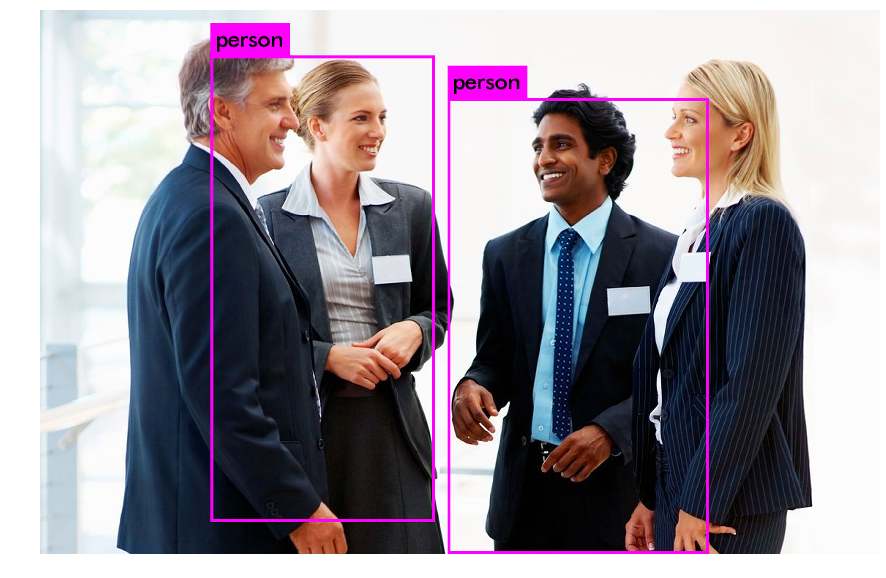

In [0]:
imShow("predictions.jpg")

In [0]:
!wget http://images.cocodataset.org/zips/train2017.zip

--2019-07-11 01:38:02--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.200.123
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.200.123|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  20.6MB/s    in 9m 36s  

2019-07-11 01:47:39 (32.0 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]



In [0]:
!unzip train2017.zip 

Archive:  train2017.zip
   creating: train2017/
 extracting: train2017/000000147328.jpg  
 extracting: train2017/000000414738.jpg  
 extracting: train2017/000000281563.jpg  
 extracting: train2017/000000063879.jpg  
 extracting: train2017/000000531349.jpg  
 extracting: train2017/000000340329.jpg  
 extracting: train2017/000000182236.jpg  
 extracting: train2017/000000326820.jpg  
 extracting: train2017/000000149364.jpg  
 extracting: train2017/000000166598.jpg  
 extracting: train2017/000000424792.jpg  
 extracting: train2017/000000178388.jpg  
 extracting: train2017/000000568154.jpg  
 extracting: train2017/000000268150.jpg  
 extracting: train2017/000000138473.jpg  
 extracting: train2017/000000382699.jpg  
 extracting: train2017/000000493952.jpg  
 extracting: train2017/000000348522.jpg  
 extracting: train2017/000000066862.jpg  
 extracting: train2017/000000024457.jpg  
 extracting: train2017/000000160437.jpg  
 extracting: train2017/000000487414.jpg  
 extracting: train2017/00000

In [0]:
!rm -rf COCO_Person
!mkdir COCO_Person

In [0]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

--2019-07-11 01:53:18--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.107.148
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.107.148|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  89.0MB/s    in 2.7s    

2019-07-11 01:53:21 (89.0 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]



In [0]:
!unzip annotations_trainval2017.zip

Archive:  annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


In [0]:
import json
filename='annotations/instances_train2017.json'
if filename:
    with open(filename, 'r') as f:
        datastore = json.load(f)

In [0]:
datastore['annotations']

[{'area': 2765.1486500000005,
  'bbox': [199.84, 200.46, 77.71, 70.88],
  'category_id': 58,
  'id': 156,
  'image_id': 558840,
  'iscrowd': 0,
  'segmentation': [[239.97,
    260.24,
    222.04,
    270.49,
    199.84,
    253.41,
    213.5,
    227.79,
    259.62,
    200.46,
    274.13,
    202.17,
    277.55,
    210.71,
    249.37,
    253.41,
    237.41,
    264.51,
    242.54,
    261.95,
    228.87,
    271.34]]},
 {'area': 1545.4213000000007,
  'bbox': [234.22, 317.11, 149.39, 38.55],
  'category_id': 58,
  'id': 509,
  'image_id': 200365,
  'iscrowd': 0,
  'segmentation': [[247.71,
    354.7,
    253.49,
    346.99,
    276.63,
    337.35,
    312.29,
    333.49,
    364.34,
    331.57,
    354.7,
    327.71,
    369.16,
    325.78,
    376.87,
    333.49,
    383.61,
    330.6,
    379.76,
    321.93,
    365.3,
    320.0,
    356.63,
    317.11,
    266.02,
    331.57,
    260.24,
    334.46,
    260.24,
    337.35,
    242.89,
    338.31,
    234.22,
    338.31,
    234.22

In [0]:
from shutil import copyfile
import os.path
from PIL import Image

i=0
for data_sample in datastore['annotations']:
  if(data_sample['category_id']==1):
    bbox=data_sample['bbox']
    image_id=data_sample['image_id']
    image_name=str(image_id).zfill(12)
    if(os.path.isfile('train2017/'+image_name+'.jpg')):
      file_src='train2017/'+image_name+".jpg"
      file_dst="COCO_Person/"+image_name+".jpg"
      copyfile(file_src, file_dst)
      im=Image.open(file_src)
      width, height = im.size
      f= open("COCO_Person/"+image_name+".txt","a")
      f.write("0 "+str((bbox[0]+bbox[2]/2)/width)+" "+str((bbox[1]+bbox[3]/2)/height)+" "+str(bbox[2]/width)+" "+str(bbox[3]/height)+'\n')
      i+=1
      #print(file_src,file_dst)
      #print(data_sample)

0 0.20039906103286387 0.43685156250000007 0.09338028169014084 0.091109375
0 0.4701643192488263 0.622765625 0.7067605633802817 0.44018750000000006



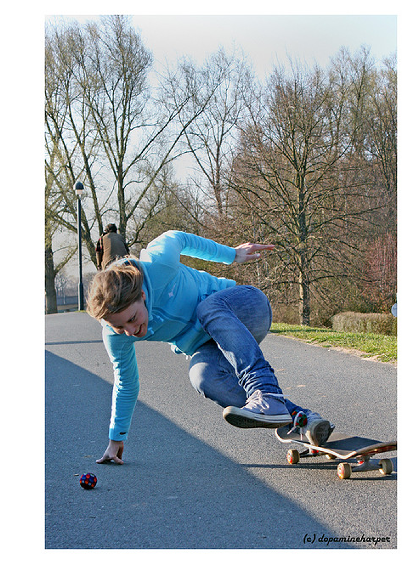

In [0]:
f= open("COCO_Person/"+'000000513072'+".txt")
print(f.read())
imShow("COCO_Person/"+'000000513072'+".jpg")

In [0]:
import os
files=os.listdir('COCO_Person')
train_name='data_for_colab/train.txt'
test_name='data_for_colab/test.txt'

train_file=open(train_name,"w+")
test_file=open(test_name,"w+")

train_count=1024
test_count=256

train_counter=0
test_counter=0

for i in range(len(files)):
  print(files[i])
  if('.jpg' in files[i]): 
    if(train_counter<train_count):
      train_file.write(os.getcwd()+'/COCO_Person/'+files[i]+"\n")
      train_counter+=1
    elif(test_counter<test_count):
      test_file.write(os.getcwd()+'/COCO_Person/'+files[i]+"\n")
      test_counter+=1
    if(train_counter>=train_count and test_counter>=test_count):
      break;
    
train_file.close()
test_file.close()

In [0]:
cd ..

/content/darknet


In [0]:
!cp /content/Yolo-Training-GoogleColab/data_for_colab/obj.data data_for_colab/obj.data 
!cp /content/Yolo-Training-GoogleColab/data_for_colab/obj.names data_for_colab/obj.names 
# you neew rewrite obj.names with yours name classes

In [108]:
!./darknet detector train data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg backup/yolov3-tiny-obj_last.weights -dont_show 

yolov3-tiny-obj
   layer   filters  size/strd(dil)      input                output
   0 conv     16       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  16 0.150 BF
   1 max               2 x 2/ 2    416 x 416 x  16 ->  208 x 208 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    208 x 208 x  16 ->  208 x 208 x  32 0.399 BF
   3 max               2 x 2/ 2    208 x 208 x  32 ->  104 x 104 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    104 x 104 x  32 ->  104 x 104 x  64 0.399 BF
   5 max               2 x 2/ 2    104 x 104 x  64 ->   52 x  52 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     52 x  52 x  64 ->   52 x  52 x 128 0.399 BF
   7 max               2 x 2/ 2     52 x  52 x 128 ->   26 x  26 x 128 0.000 BF
   8 conv    256       3 x 3/ 1     26 x  26 x 128 ->   26 x  26 x 256 0.399 BF
   9 max               2 x 2/ 2     26 x  26 x 256 ->   13 x  13 x 256 0.000 BF
  10 conv    512       3 x 3/ 1     13 x  13 x 256 ->   13 x  13 x 512 0.399 BF
  11 max               2 x 2/ 1     

In [0]:
from google.colab import files
uploaded = files.upload() 
for name, data in uploaded.items():
  with open(name, 'wb') as f:
    f.write(data)
    print ('saved file', name)

Saving 03.jpg to 03.jpg
saved file 03.jpg


In [0]:
!./darknet detector test data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg backup/yolov3-tiny-obj_last.weights LectureCounter/03.jpg -i 0 -thresh 0.5

   layer   filters  size/strd(dil)      input                output
   0 conv     16       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  16 0.150 BF
   1 max               2 x 2/ 2    416 x 416 x  16 ->  208 x 208 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    208 x 208 x  16 ->  208 x 208 x  32 0.399 BF
   3 max               2 x 2/ 2    208 x 208 x  32 ->  104 x 104 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    104 x 104 x  32 ->  104 x 104 x  64 0.399 BF
   5 max               2 x 2/ 2    104 x 104 x  64 ->   52 x  52 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     52 x  52 x  64 ->   52 x  52 x 128 0.399 BF
   7 max               2 x 2/ 2     52 x  52 x 128 ->   26 x  26 x 128 0.000 BF
   8 conv    256       3 x 3/ 1     26 x  26 x 128 ->   26 x  26 x 256 0.399 BF
   9 max               2 x 2/ 2     26 x  26 x 256 ->   13 x  13 x 256 0.000 BF
  10 conv    512       3 x 3/ 1     13 x  13 x 256 ->   13 x  13 x 512 0.399 BF
  11 max               2 x 2/ 1     13 x  13 x 512 -

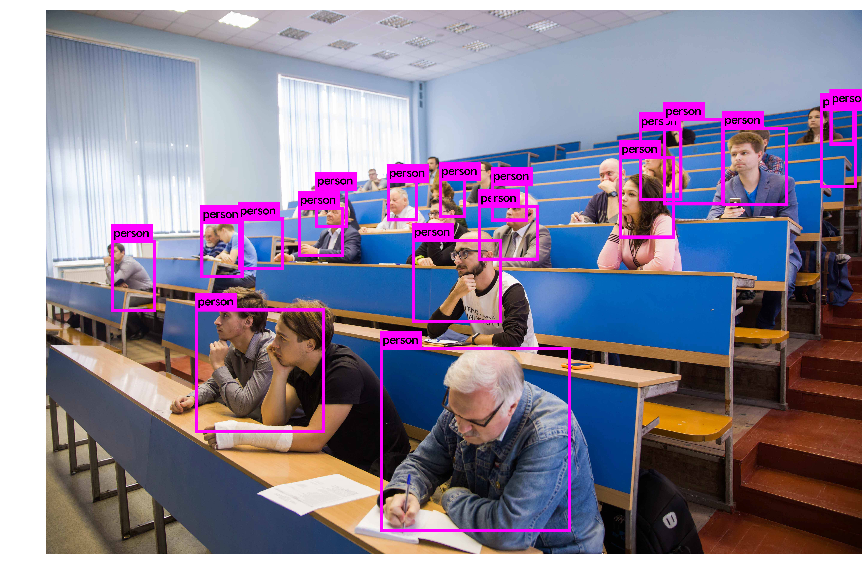

In [0]:
imShow('predictions.jpg')


In [0]:
!./darknet detector calc_anchors data_for_colab/obj.data -num_of_clusters 5 -width 416 -height 416


 num_of_clusters = 5, width = 416, height = 416 
 read labels from 1024 images 
 loaded 	 image: 1024 	 box: 4227
 all loaded. 

 calculating k-means++ ...

 iterations = 54 


 avg IoU = 54.23 % 

Saving anchors to the file: anchors.txt 
anchors =  11, 25,  33, 78,  75,179, 145,278, 306,306
^C


# Installing darkflow (.weights to .pb converter)
used link https://blog.francium.tech/real-time-object-detection-on-mobile-with-flutter-tensorflow-lite-and-yolo-android-part-a0042c9b62c6

In [0]:
!pip install Cython
!git clone https://github.com/thtrieu/darkflow.git
%cd darkflow
!sed -i -e 's/self.offset = 16/self.offset = 20/g' darkflow/utils/loader.py
!python3 setup.py build_ext --inplace
!pip install .

Cloning into 'darkflow'...
remote: Enumerating objects: 2706, done.
remote: Total 2706 (delta 0), reused 0 (delta 0), pack-reused 2706
Receiving objects: 100% (2706/2706), 32.98 MiB | 27.03 MiB/s, done.
Resolving deltas: 100% (1760/1760), done.
/content/darknet/darkflow
Compiling darkflow/cython_utils/nms.pyx because it changed.
Compiling darkflow/cython_utils/cy_yolo2_findboxes.pyx because it changed.
Compiling darkflow/cython_utils/cy_yolo_findboxes.pyx because it changed.
[1/3] Cythonizing darkflow/cython_utils/cy_yolo2_findboxes.pyx
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:367: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/darknet/darkflow/darkflow/cython_utils/cy_yolo2_findboxes.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
[2/3] Cythonizing darkflow/cython_utils/cy_yolo_findboxes.pyx
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:367: FutureWarnin

In [0]:
ls 

bin/    ckpt/      flow*       LICENSE      sample_img/  yolov2-tiny.cfg
build/  darkflow/  labels.txt  preview.png  setup.py     yolov2-tiny.weights
cfg/    demo.gif   label.txt   README.md    test/


In [0]:
%cd darkflow/

/content/darknet/darkflow


In [0]:
!curl https://pjreddie.com/media/files/yolov2-tiny.weights -o yolov2-tiny.weights
!curl https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov2-tiny.cfg -o yolov2-tiny.cfg
!curl https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names -o labels.txt

!flow --model yolov2-tiny.cfg --load yolov2-tiny.weights --savepb

In [0]:
!git clone https://github.com/mystic123/tensorflow-yolo-v3.git

Cloning into 'tensorflow-yolo-v3'...
remote: Enumerating objects: 204, done.
remote: Total 204 (delta 0), reused 0 (delta 0), pack-reused 204
Receiving objects: 100% (204/204), 52.84 KiB | 563.00 KiB/s, done.
Resolving deltas: 100% (103/103), done.


In [0]:
!python3 convert_weights_pb.py --class_names /content/darknet/data_for_colab/obj.names --data_format NHWC --weights_file /content/darknet/backup/yolov3-tiny-obj_last.weights --tiny

W0711 06:16:09.092172 140650466498432 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W0711 06:16:09.094320 140650466498432 deprecation_wrapper.py:119] From convert_weights.py:52: The name tf.app.run is deprecated. Please use tf.compat.v1.app.run instead.

W0711 06:16:09.095126 140650466498432 deprecation_wrapper.py:119] From convert_weights.py:34: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0711 06:16:09.097419 140650466498432 deprecation_wrapper.py:119] From convert_weights.py:36: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0711 06:16:10.101466 140650466498432 depre

# Converting to .tflite
**saving tflite model**

In [0]:
!tflite_convert \
  --graph_def_file=/content/darknet/darkflow/tensorflow-yolo-v3/frozen_darknet_yolov3_model.pb \
  --output_file=yolov3_graph.lite \
  --input_format=TENSORFLOW_GRAPHDEF \
  --output_format=TFLITE \
  --input_array=inputs \
  --output_array=output_boxes \
  --inference_type=FLOAT \
  --input_data_type=FLOAT 

2019-07-11 06:32:24.567351: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcuda.so.1
2019-07-11 06:32:24.570462: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1005] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2019-07-11 06:32:24.570899: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1640] Found device 0 with properties: 
name: Tesla K80 major: 3 minor: 7 memoryClockRate(GHz): 0.8235
pciBusID: 0000:00:04.0
2019-07-11 06:32:24.571219: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcudart.so.10.0
2019-07-11 06:32:24.572633: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcublas.so.10.0
2019-07-11 06:32:24.574377: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcufft.so.10